# **CCAI-411: Senior Project**

> # **Machine Learning-based System for Diagnosis of Teeth Problems and Treatment Recommendation**

#### Amirah Al-Hamed | 2008945
#### Rawan Baobiad | 2010685
#### Samar Mohammed | 2116922
#### Nada Alsawadi | 2010682
#### Layan refaee | 2115867

In [ ]:
!nvidia-smi

Sun May  5 17:49:23 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 28.8/201.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

## **Load the dataset from Roboflow**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="5gHbkbuDA62UIQOM33nJ")
project = rf.workspace("demo-h9a4l").project("teeth-2-wcbcv")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Normalize pixel values between 0 and 1**

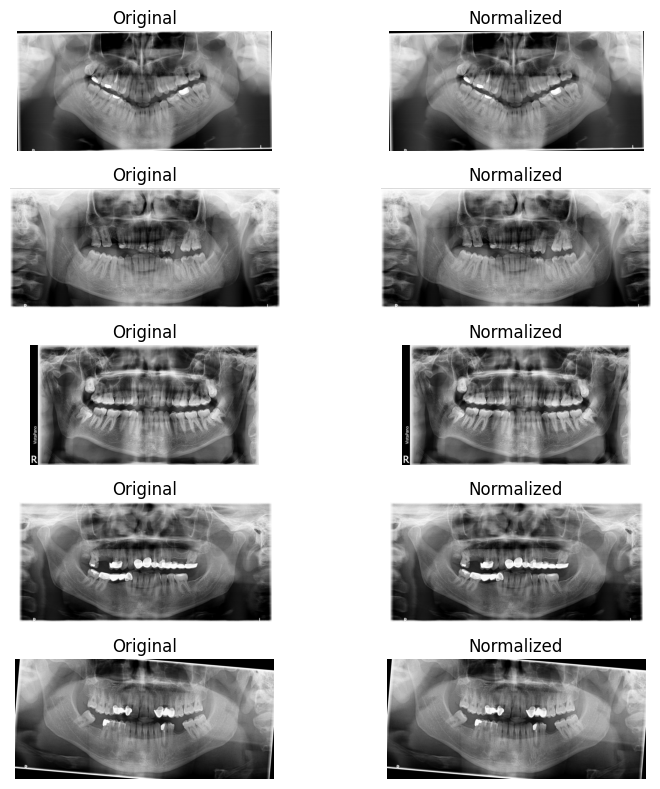

In [ ]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Define the paths to the downloaded dataset
dataset_dir = "/content/Teeth-2-1/train"
image_dir = os.path.join(dataset_dir, "images")

# Preprocessing function for images
def preprocess_image(image_path):
    image = Image.open(image_path)
    # Convert image to numpy array
    image_array = np.array(image)
    # Normalize pixel values between 0 and 1
    normalized_image = image_array / 255.0
    return normalized_image

# Select a few images for visualization
num_images_to_visualize = 5

# Preprocess and visualize the images
fig, axes = plt.subplots(nrows=num_images_to_visualize, ncols=2, figsize=(8, 8))

for i, image_file in enumerate(os.listdir(image_dir)[:num_images_to_visualize]):
    image_path = os.path.join(image_dir, image_file)
    # Load and preprocess the original image
    original_image = Image.open(image_path)
    preprocessed_image = preprocess_image(image_path)

    # Plot the original image
    axes[i][0].imshow(original_image)
    axes[i][0].set_title("Original")

    # Plot the preprocessed image
    axes[i][1].imshow(preprocessed_image)
    axes[i][1].set_title("Normalized")

    # Remove ticks and labels
    axes[i][0].axis("off")
    axes[i][1].axis("off")

plt.tight_layout()
plt.show()


## **Trains YOLOv8s model**

In [ ]:

# Trains YOLOv8s model for 100 epochs on a dataset, with image size of 640 and plots enabled.
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=100 imgsz=640 plots=True

100% 21.5M/21.5M [00:00<00:00, 343MB/s]
New https://pypi.org/project/ultralytics/8.2.9 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/Teeth-2-1/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width

## **Data visualization**

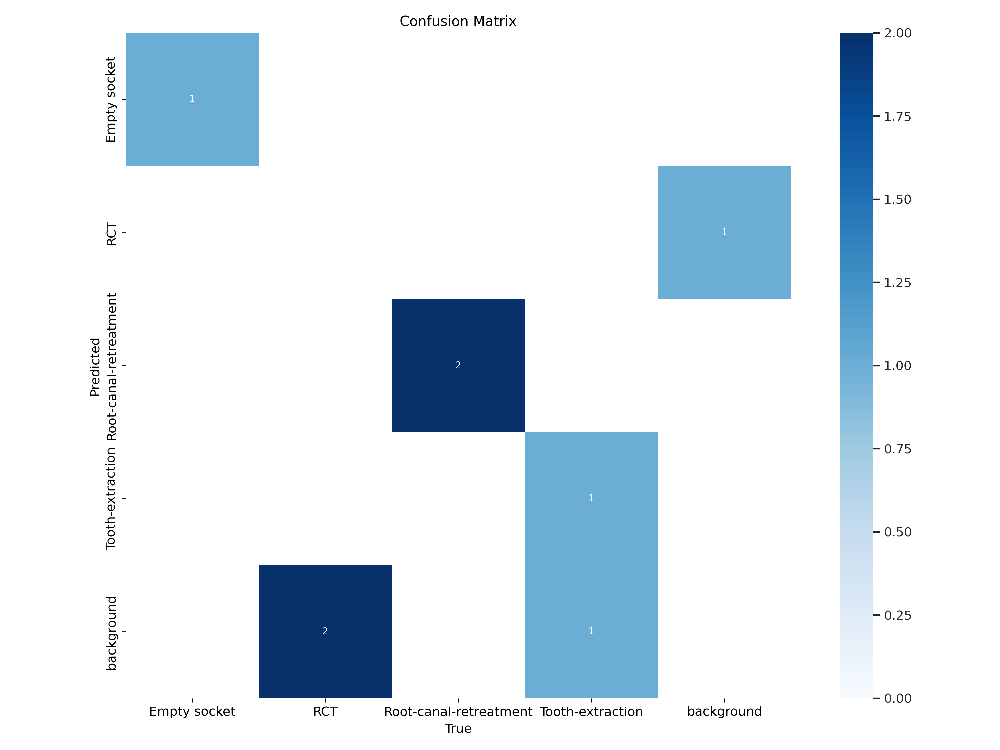

In [ ]:
from IPython.display import display, Image
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)


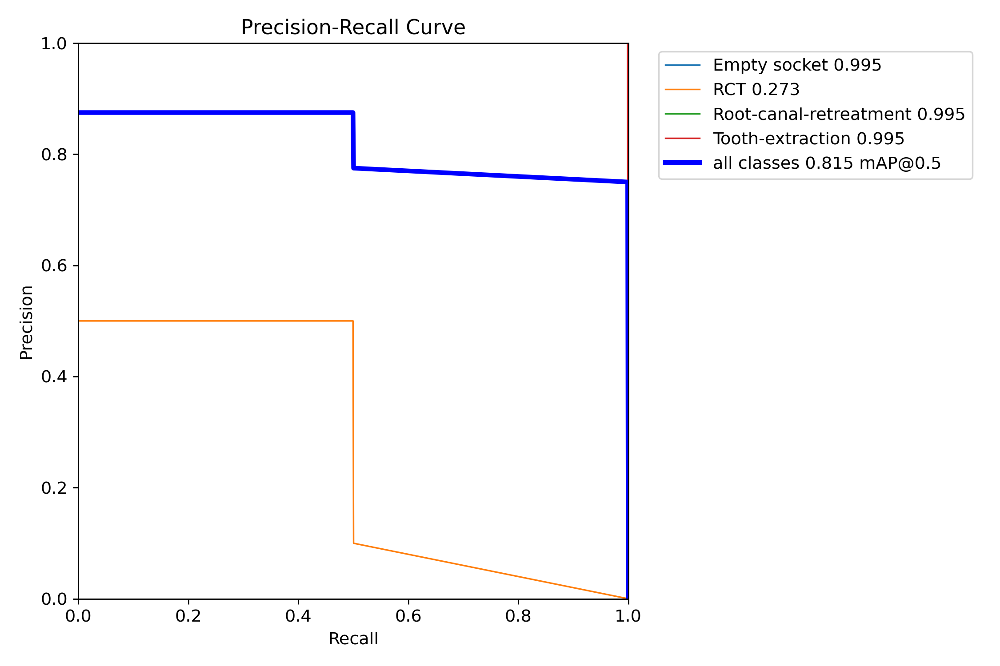

In [ ]:
from IPython.display import display, Image
Image(filename=f'/content/runs/detect/train/PR_curve.png', width=600)


## **Runs YOLO object detection on validation data**

In [11]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/Teeth-2-1/valid/labels.cache... 5 images, 0 backgrounds, 0 corrupt: 100% 5/5 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  1.38it/s]
                   all          5          7      0.719      0.736      0.814      0.567
          Empty socket          5          1      0.801          1      0.995      0.308
                   RCT          5          2      0.199      0.199      0.271      0.244
Root-canal-retreatment          5          2      0.878          1      0.995      0.895
  

## **Test unseen data**

In [12]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source=/content/drive/MyDrive/test save=True

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients, 28.4 GFLOPs

image 1/4 /content/drive/MyDrive/test/train_0.png: 416x640 2 Empty sockets, 2 RCTs, 1 Tooth-extraction, 75.7ms
image 2/4 /content/drive/MyDrive/test/train_196.png: 352x640 1 Empty socket, 1 RCT, 2 Tooth-extractions, 76.5ms
image 3/4 /content/drive/MyDrive/test/train_41.png: 352x640 1 Tooth-extraction, 10.7ms
image 4/4 /content/drive/MyDrive/test/train_61.png: 352x640 1 Root-canal-retreatment, 10.7ms
Speed: 2.7ms preprocess, 43.4ms inference, 145.8ms postprocess per image at shape (1, 3, 352, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


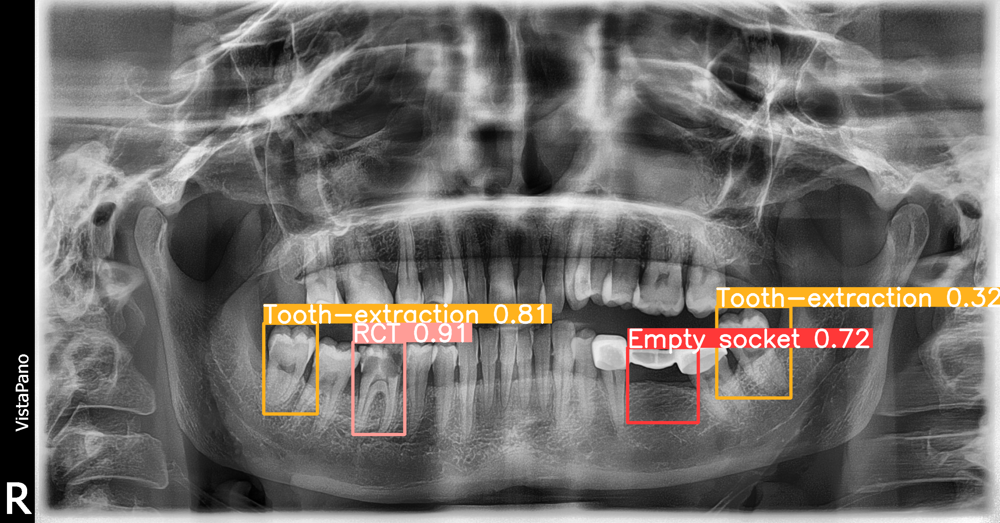

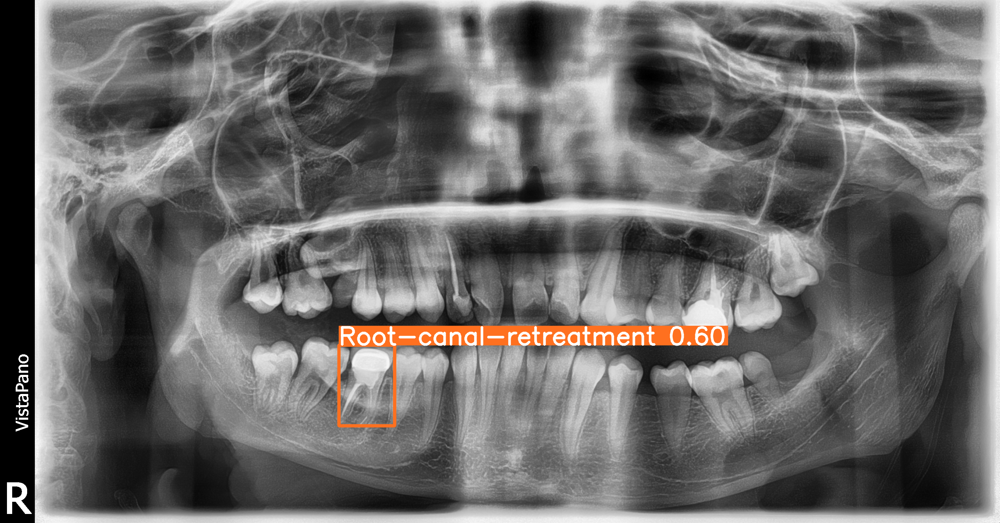

In [13]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict2/*.png'):
      display(Image(filename=image_path, width=600))
      print("\n")